___
# Initial analysis

In [1]:
import numpy as np
import pandas as pd
import math as m
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf
from scipy import *

import scaleogram as scg
import matplotlib.pyplot as plt
import warnings

from visuals import *
from my_lib import *
from SSA_lib import SSA

In [2]:
warnings.simplefilter('ignore')

plt.rcParams['figure.figsize'] = 16, 8
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 8
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 16
plt.rcParams['axes.titlesize'] = 24
plt.rcParams['axes.labelsize'] = 8

In [3]:
def Sphere_projection(track2, n = 1):
    
    _x = track2[:,0] - track2[:,0].mean()
    _y = track2[:,1] - track2[:,1].mean()
    _z = track2[:,2] - track2[:,2].mean()
    
    track = np.array([_x,_y,_z]).T
    
    
    for i in range(len(track)):
        track[i] = track[i]/((track[i,:]**2).sum())**.5

    t, p = np.mgrid[0:np.pi:100j, 0:2*np.pi:100j]

    x_s = 0.98*np.sin(t)*np.cos(p)
    y_s = 0.98*np.sin(t)*np.sin(p)
    z_s = 0.98*np.cos(t)

    fig_2 = go.Figure()

    fig_2.add_trace(go.Surface(x=x_s,
                               y=y_s,
                               z=z_s,
                               showscale=False,
                               surfacecolor = z_s))

    fig_2.add_trace(go.Scatter3d(x=track[:,0][::n],
                                 y=track[:,1][::n],
                                 z=track[:,2][::n],
                                 #mode='markers',
                                 marker=dict(
                                             size=2,
                                             line=dict(
                                                        width=0.1
                                                      )

                                             ),
                                 name='trajectory'
                                )
                    )
    fig_2.add_trace(go.Scatter3d(x=[track[0, 0]],
                               y=[track[0, 1]],
                               z=[track[0, 2]],
                               mode='markers',
                               marker_size=10,
                               marker_color='rgba(255, 10, 0, .7)',
                               name='Start point'))

    fig_2.add_trace(go.Scatter3d(x=[track[-1, 0]],
                               y=[track[-1, 1]],
                               z=[track[-1, 2]],
                               mode='markers',
                               marker_size=10,
                               marker_color='rgba(10, 250, 250, .7)',
                               name='End point'))

    fig_2.layout.template = 'plotly_white'
    fig_2.show()

    return

___
# Choose first 20 steps
## Common walking, phone accelerometer
### Frequency 0.91$\pm$1 s was found empirically

In [4]:
dt = 459*20
#data = pd.read_csv('data/long_walk_100_acc.csv', delimiter =';', decimal=',')[3815+6*455:3815+6*455+dt]
data = pd.read_csv('data/long_walk_100_acc.csv', delimiter =';', decimal=',')[7009:7009+dt]
#data = pd.read_csv('data/long_walk_100_acc.csv', delimiter =';', decimal=',')[3785:8000]
#data = pd.read_csv('data/home_lin_10_lac.csv', delimiter =';', decimal=',')[:]
frecuency = len(data)/(data['time'].values[-1]-data['time'].values[0])
assert 480 < frecuency < 520

x_acc = ( (data['X_value'].values)**2 + (data['Y_value'].values)**2 + (data['Z_value'].values)**2)**.5
_m = np.mean(x_acc)
x_acc -= _m
t = (data['time'].values).astype(float).reshape([-1,])
t = np.linspace(0,t[-1]-t[0],len(x_acc))

fig = go.Figure()
fig.add_scatter(y = x_acc, mode='lines', name='Sum squares')
fig.show()

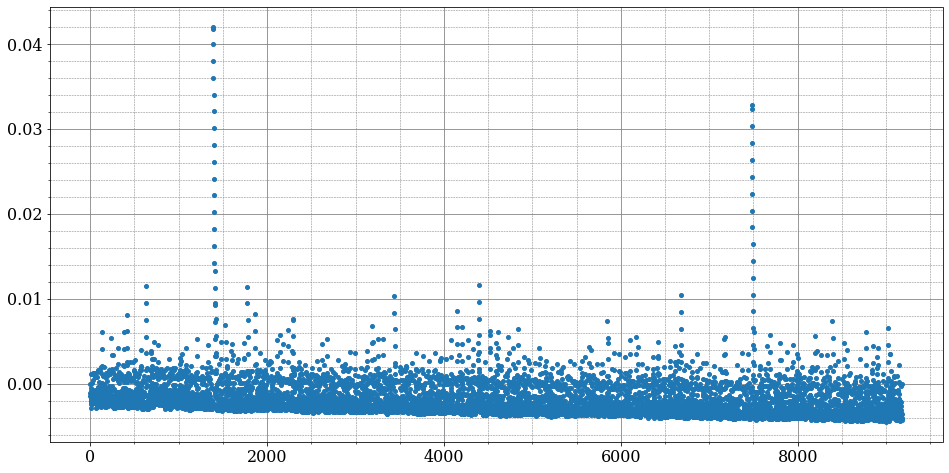

In [5]:
t_real = (data['time'].values).astype(float).reshape([-1,])
t_real = t_real - t_real[0]

plt.plot(t_real-t,'.')
plt.grid(which='major',
    color = 'gray', 
    linewidth = 0.8)
plt.minorticks_on()
plt.grid(which='minor', 
    color = 'gray', 
    linestyle = '--',
    linewidth = 0.5)
plt.show()

In [6]:
_m

10.792185704435663

In [7]:
"""fig = go.Figure()
fig.add_scatter(x = t, y = x_acc, mode='lines', name='Sum squares')
fig.show()"""

"fig = go.Figure()\nfig.add_scatter(x = t, y = x_acc, mode='lines', name='Sum squares')\nfig.show()"

___
# Velocity figure

In [8]:
def moving_average(a, n=3):
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

In [9]:
_t,_x = integ(t,x_acc)

In [10]:
mean_w = 1500

fig = go.Figure()
fig.add_scatter(x = _t[mean_w:], y = (_x)[mean_w:],
                mode='lines', 
                name='Velocity')
fig.add_scatter(x = _t[mean_w:], y = moving_average(_x,mean_w+1),
                mode='lines', 
                name='Velocity')
fig['layout']['yaxis1'].update(title='Velocity[m/s]')
fig['layout']['xaxis1'].update(title='Time[s]')
fig.show()

___
# Autocorrelation Function


In [11]:
acf_x = acf(
        x_acc,
        nlags=3000,
        alpha=0.5,
)

In [12]:
fig = go.Figure()
fig.add_scatter(x = np.arange(len(acf_x[0])), y = acf_x[0], mode='lines', name='ACF')
fig.show()

In [13]:
np.arange(0,4000,461)

array([   0,  461,  922, 1383, 1844, 2305, 2766, 3227, 3688])

In [14]:
T_one_step = 460/500
T_one_step

0.92

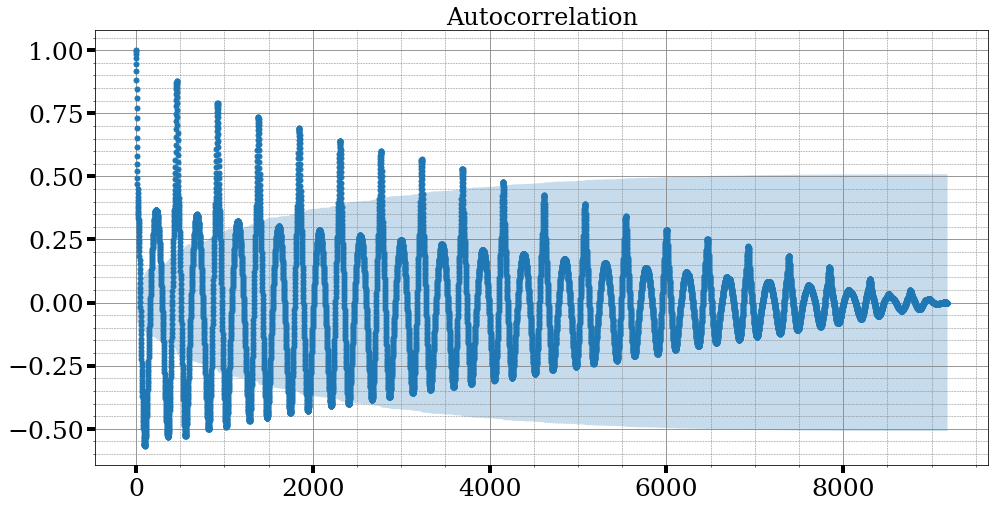

In [15]:
ax = plot_acf(x_acc,
              lags=len(x_acc)-1,
              use_vlines = False,
              alpha=0.1
         )
plt.tick_params(axis='both', which='major', labelsize=25,length=8, width=4)
plt.grid(which='major',
    color = 'gray', 
    linewidth = 0.8)
plt.minorticks_on()
plt.grid(which='minor', 
    color = 'gray', 
    linestyle = '--',
    linewidth = 0.5)
plt.show()

# Fast Fourier transforms¶

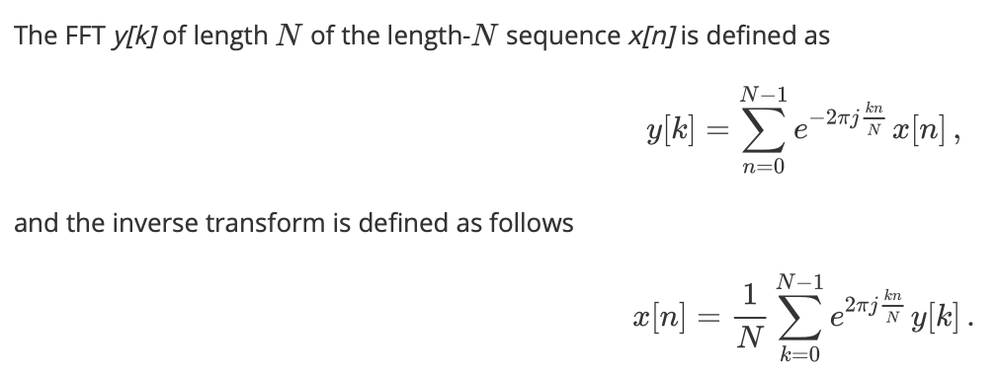

In [16]:
Fs = 500

N = len(x_acc)

__Abs = 2.0/N * np.abs(fft(x_acc)[0:N//2])

__FS = np.linspace(0.0, 1.0/2.0*Fs, N//2)

# plotting the spectrum
fig = go.Figure()
fig.add_scatter(x = __FS[0:100],
                y = __Abs[0:100],
                mode='lines',
                name='Magnitude'
               )

temp_fft = fft(x_acc)[0:N//2]

__Ph = np.arctan2(np.imag(temp_fft),np.real(temp_fft))

fig.add_scatter(x = __FS[0:100],
                y = __Ph[0:100],
                mode='markers',
                name='Phase'
               )

fig.add_trace(go.Bar(x= __FS[0:100],
                      y= __Ph[0:100],
                        #mode='markers',
                        name='Phase'
                    )
             )


fig['layout']['yaxis1'].update(title='Magnitude')
fig['layout']['xaxis1'].update(title='Frec[1/s]')
fig.show()

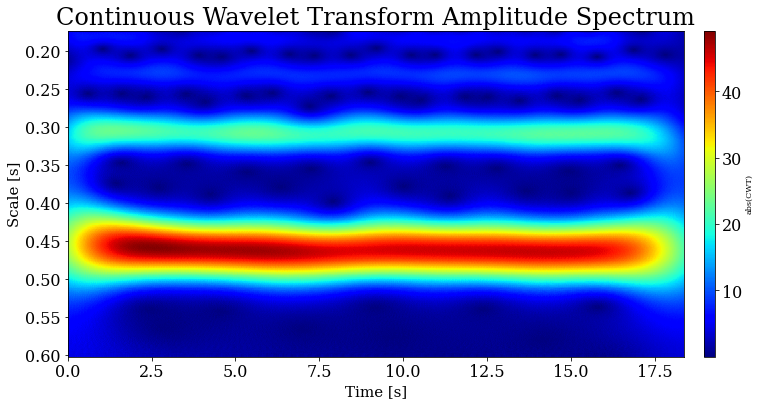

In [17]:
scales = np.linspace(130,450,500)
ax = scg.cws(t[::1], x_acc, 
             figsize = (12,6),
             scales = scales,
             wavelet = 'cmor6-1.5',
             coi=False
            )
ax.set_ylabel('Scale [s]',fontsize = 15)
ax.set_xlabel('Time [s]',fontsize = 15)
plt.show()

# Application of SSA

In [18]:
accel_ssa = SSA(x_acc, 500)

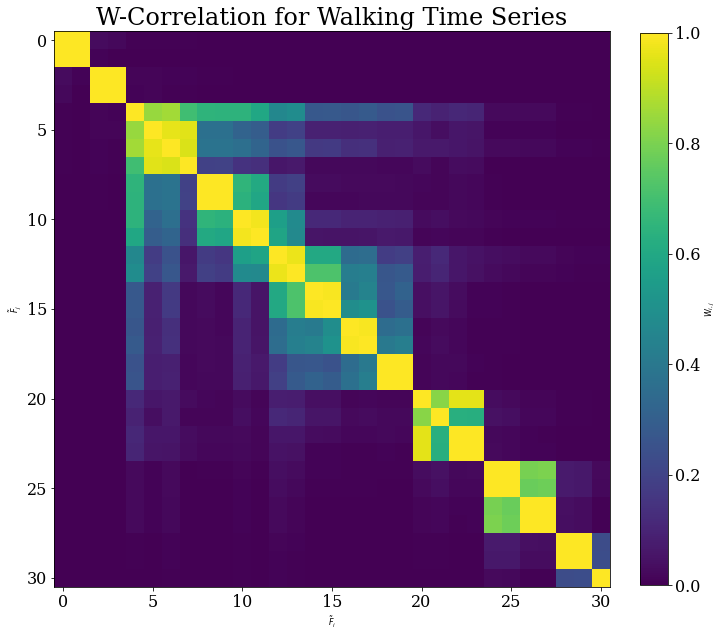

In [19]:
plt.figure(figsize=(11, 11))
accel_ssa.plot_wcorr(max=30)
plt.title("W-Correlation for Walking Time Series");

In [20]:
n_fig = 1000
fig = go.Figure()

fig.add_scatter(x = t[:n_fig], y = x_acc[:n_fig], mode='lines', name='Real')

fig.add_scatter(x = t[:n_fig], y = accel_ssa.reconstruct(slice(0,5))[:n_fig], mode='lines', name='SSA')


x = 4.6*np.cos(2*np.pi*2.18*(t[:n_fig])-.24) + 2.39*np.cos(2*np.pi*3.27*(t[:n_fig])-2.46)

fig.add_scatter(x = t[:n_fig], y = x, mode='lines', name='Main frec')

fig.show()

In [21]:
fig = go.Figure()
fig.add_scatter(x = t[:], y = accel_ssa.reconstruct(slice(0,4))[:], mode='lines', name='slice')
fig.show()

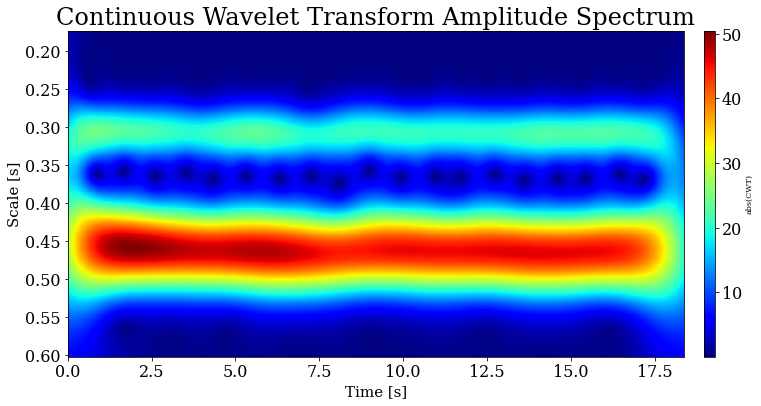

In [22]:
import scaleogram as scg
scales = np.linspace(130,450,500)
ax = scg.cws(t[::1], accel_ssa.reconstruct(slice(0,4))[::1], 
             figsize = (12,6),
             scales = scales,
             wavelet = 'cmor3-1.5',
             coi=False
            )
ax.set_ylabel('Scale [s]',fontsize = 15)
ax.set_xlabel('Time [s]',fontsize = 15)
plt.show()

In [83]:
x_acc_clear = accel_ssa.reconstruct(slice(0,5))

track1, basis1 = phase_track(np.array([x_acc_clear]).T, 600, 2)

plot_phase_track(track1[:])

Explained variation for 2 principal components: [0.40011295 0.3676284 ]
Cumulative explained variationfor 2 principal components: 0.7677413524588341



In [84]:
track2, basis2 = phase_track(np.array([x_acc_clear]).T, 600, 3)

Explained variation for 3 principal components: [0.40011295 0.3676284  0.11352861]
Cumulative explained variationfor 3 principal components: 0.8812699616005993



In [85]:
plot_phase_track(track2)

In [86]:
Sphere_projection(track2, n = 1)

No handles with labels found to put in legend.


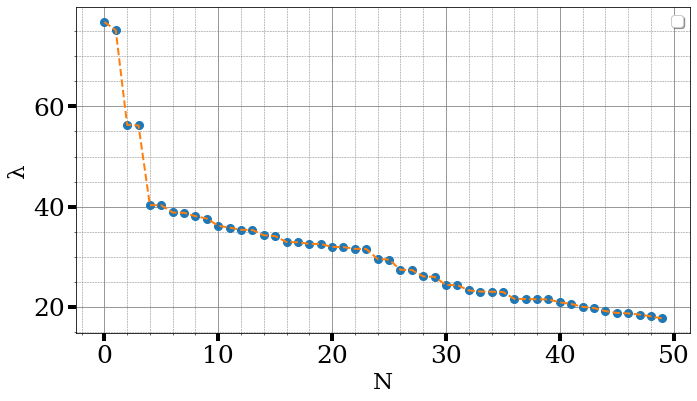

In [41]:
eigenvalues_plot(x_acc,600,1,num_l = 50,MinMax = False)

No handles with labels found to put in legend.


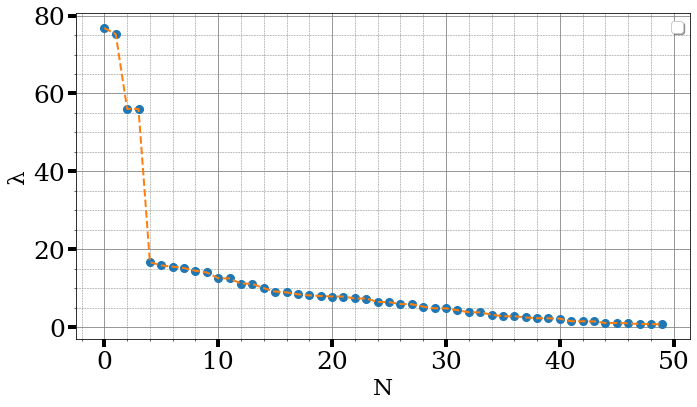

In [28]:
eigenvalues_plot(x_acc_clear,600,1,num_l = 50)

In [123]:
track5, basis5 = phase_track(np.array([x_acc_clear]).T, 600, 4)

Explained variation for 4 principal components: [0.40011295 0.3676284  0.11352861 0.11324896]
Cumulative explained variationfor 4 principal components: 0.9945189233866937



In [ ]:
track5_norm = track5

for i in range(len(track5)):
    track5_norm[i] = track5[i]/((track5[i,:]**2).sum())**.5

In [ ]:
for i in range(4):
    plt.plot(track5_norm[:1000,i])
    plt.show()

___
# Variance of timeseries

In [29]:
# нормировка
n = 1
_x = track2[:,0] - track2[:,0].mean()
_y = track2[:,1] - track2[:,1].mean()
_z = track2[:,2] - track2[:,2].mean()

track_norm = np.array([_x,_y,_z]).T


for i in range(len(track_norm)):
    track_norm[i] = track_norm[i]/((track_norm[i,:]**2).sum())**.5

In [30]:
# данные для сферы
_t, p = np.mgrid[0:np.pi:100j, 0:2*np.pi:100j]

x_s = 0.9*np.sin(_t)*np.cos(p)
y_s = 0.9*np.sin(_t)*np.sin(p)
z_s = 0.9*np.cos(_t)

In [31]:
#вычисляем среднюю
n_m = 15
track_mean = track_norm[:460,:]/n_m

for i in range(1, n_m):
    track_mean += track_norm[460*i:460*(i+1),:]/n_m

In [32]:
#вычисляем дисперсию
n_m = 15
track_VAR = (track_norm[:460,:]-track_mean[:460,:])**2/(n_m-1)

for i in range(1, n_m):
    track_VAR += (track_norm[460*i:460*(i+1),:] - track_mean[:460,:])**2/(n_m-1)
    
track_STD = track_VAR**.5


track_STD_UP = (track_mean + track_STD)
for i in range(len(track_STD_UP)):
    track_STD_UP[i] = track_STD_UP[i]/((track_STD_UP[i,:]**2).sum())**.5
    
    
track_STD_DOWN = (track_mean - track_STD)
for i in range(len(track_STD_UP)):
    track_STD_DOWN[i] = track_STD_DOWN[i]/((track_STD_DOWN[i,:]**2).sum())**.5


___
# To spherical coordinates

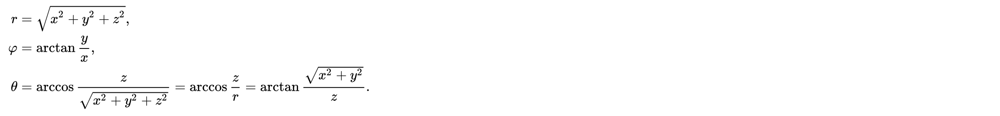

In [35]:
def to_spherical(track_norm):
    r = np.ones(len(track_norm))
    phi = np.arctan2(track_norm[:,1],track_norm[:,0])+np.pi
    theta = np.arccos(track_norm[:,2])
    return r,phi,theta

In [36]:
fig = go.Figure()
r,phi,theta = to_spherical(track_norm)
fig.add_scatter(y = theta,
                x = phi,
                mode='markers',
               )

r_m,phi_m,theta_m = to_spherical(track_mean)
fig.add_scatter(y = theta_m,
                x = phi_m,
                mode='markers',
               )
#for i in range(10):
fig['layout']['yaxis1'].update(title='theta [0,pi]')
fig['layout']['xaxis1'].update(title='phi [0,2pi]')

fig.show()


In [50]:
#вычисляем дисперсию
n_m = 15
theta_VAR = (theta[:460]-theta_m[:460])**2/(n_m-1)

for i in range(1, n_m):
    theta_VAR += (theta[460*i:460*(i+1)] - theta_m[:460])**2/(n_m-1)
    
theta_STD = theta_VAR**.5

theta_STD_UP = (theta_m + 2*theta_STD)
theta_STD_DOWN = (theta_m - 2*theta_STD)

In [51]:
fig = go.Figure()

fig.add_scatter(y = theta,
                x = phi,
                mode='markers',
               )

fig.add_scatter(y = theta_m,
                x = phi_m,
                mode='markers',
               )

fig.add_scatter(y = theta_STD_UP,
                x = phi_m,
                mode='markers',
               )

fig.add_scatter(y = theta_STD_DOWN,
                x = phi_m,
                mode='markers',
               )



fig['layout']['yaxis1'].update(title='theta [0,pi]')
fig['layout']['xaxis1'].update(title='phi [0,2pi]')

fig.show()

In [ ]:
fig_2 = go.Figure()


fig_2.add_trace(go.Surface(x=x_s,
                           y=y_s,
                           z=z_s,
                           showscale=False,
                           surfacecolor = z_s))

#данные
fig_2.add_trace(go.Scatter3d(x=0.97*track_norm[:,0][::n],
                             y=0.97*track_norm[:,1][::n],
                             z=0.97*track_norm[:,2][::n],
                             #mode='markers',
                             marker=dict(
                                         size=2,
                                         line=dict(
                                                    width=0.1
                                                  )

                                         ),
                             name='trajectory'
                            )
               )

#среднее
fig_2.add_trace(go.Scatter3d(
                             x = track_mean[:,0],
                             y = track_mean[:,1],
                             z = track_mean[:,2],
                             #mode='markers',
                             marker=dict(
                                         size=2,
                                         line=dict(
                                                    width=0.1
                                                  )

                                         ),
                             name='mean_trajectory'
                            )
               )
#среднее + СКО
fig_2.add_trace(go.Scatter3d(x = track_STD_UP[:,0],
                             y = track_STD_UP[:,1],
                             z = track_STD_UP[:,2],
                             #mode='markers',
                             marker=dict(
                                         size=2,
                                         line=dict(
                                                    width=0.1
                                                  )

                                         ),
                             name='E+Var'
                            )
               )

fig_2.add_trace(go.Scatter3d(x = track_STD_DOWN[:,0],
                             y = track_STD_DOWN[:,1],
                             z = track_STD_DOWN[:,2],
                             #mode='markers',
                             marker=dict(
                                         size=2,
                                         line=dict(
                                                    width=0.1
                                                  )

                                         ),
                             name='E-Var'
                            )
               )

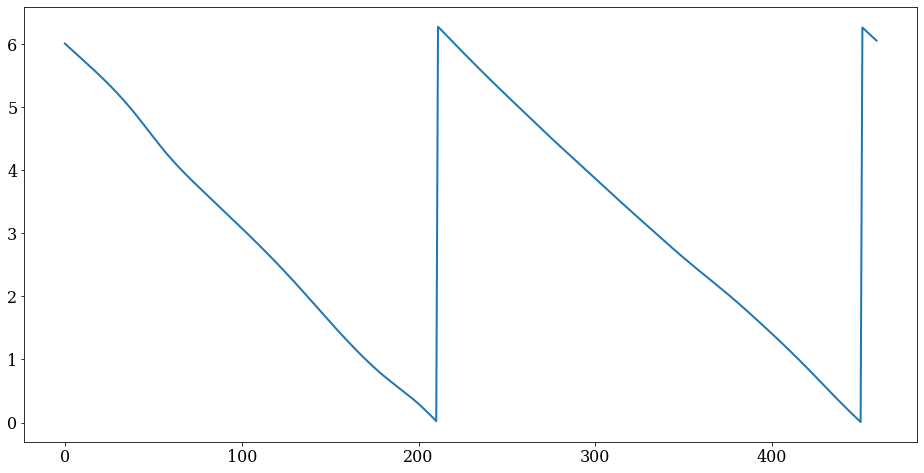

In [43]:
plt.plot(phi_m[:])

In [63]:
import pyshtools as pysh

In [99]:
from scipy.special import sph_harm

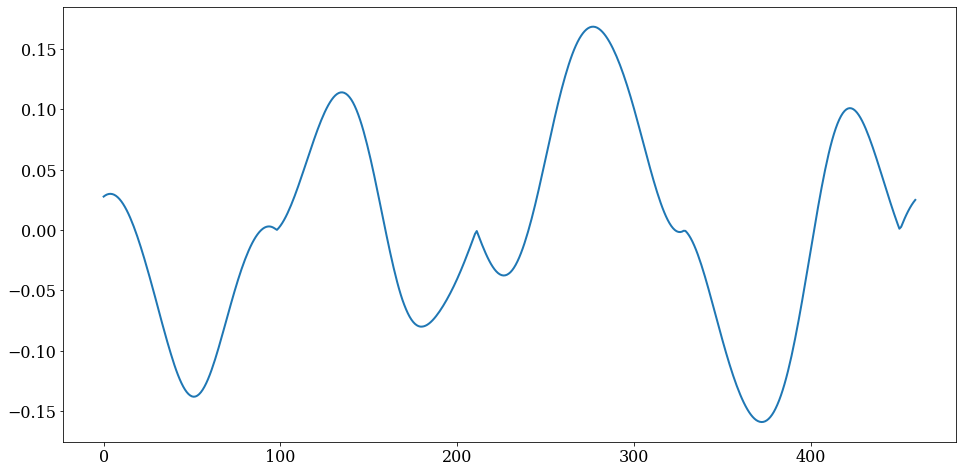

In [109]:
plt.plot(sph_harm(1, 1, theta_m, phi_m))

In [100]:
sph_harm(0,0,)

ValueError: invalid number of arguments

In [64]:
degrees = np.arange(101, dtype=float)
degrees[0] = np.inf
power = degrees**(-2)

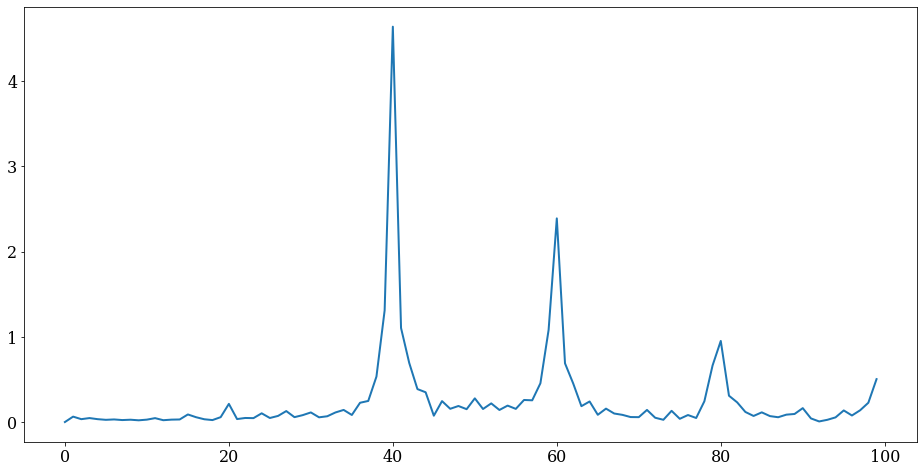

In [65]:
plt.plot(__Abs[0:100])

In [97]:
clm = pysh.SHCoeffs.from_array()

TypeError: from_array() missing 1 required positional argument: 'coeffs'

In [96]:
x = pysh.SHGravCoeffs.from_array()

TypeError: from_array() missing 3 required positional arguments: 'coeffs', 'gm', and 'r0'

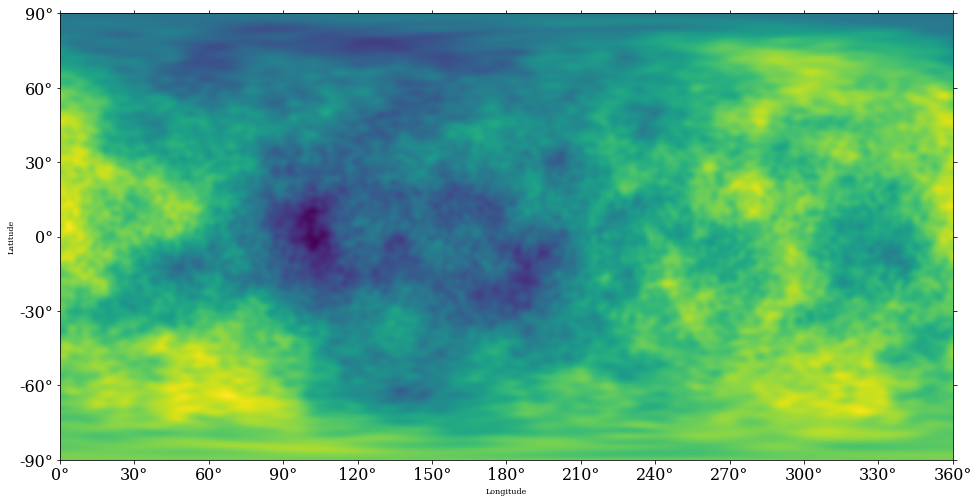

In [69]:
grid = clm.expand()
fig, ax = grid.plot(show=False)